
# Machine Learning
* Vectorization with TFIDF
* Dimensionality Reduction with PCA
* Clustering with KMeans
* Visualization of Clusters
* Classification with SVM

In [31]:
import pandas as pd
import numpy as np
import time
import datetime
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn import metrics
from scipy.spatial.distance import cdist
from IPython.display import clear_output


__Import work_data.csv file__

In [32]:
work_data = pd.read_csv('work_data.csv')

In [33]:
work_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10126 entries, 0 to 10125
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   text                10126 non-null  object
 1   word_count          10126 non-null  int64 
 2   unique_words_count  10126 non-null  int64 
 3   lang                10126 non-null  object
 4   label               10126 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 395.7+ KB


In [34]:
work_data.describe()

,word_count,unique_words_count,label
count,10126.000000,10126.000000,10126.000000
mean,4620.628086,1281.674896,1.216275
std,1320.257168,268.374557,0.878515
min,3001.000000,1001.000000,0.000000
25%,3656.250000,1090.000000,0.000000
50%,4265.000000,1199.000000,2.000000
75%,5197.750000,1390.000000,2.000000
max,9972.000000,3250.000000,2.000000


In [35]:
work_data.head()

,text,word_count,unique_words_count,lang,label
0,surfactant protein d pulmonary host defense su...,3903,1060,en,2
1,heme oxygenase carbon monoxide pulmonary medic...,3480,1019,en,2
2,functional genomic functional immunomic new ch...,3851,1051,en,2
3,model base design growth attenuated virus live...,4262,1029,en,2
4,object simulation model model hypothetical dis...,3915,1111,en,0


__Vectorization of datasets__

In [36]:
def Vectorization(corpus, max_features):
    total_time = 0
    start = time.time()
    
    vectorizer = TfidfVectorizer(max_features=max_features)
    X = vectorizer.fit_transform(corpus)
    
    stop = time.time()
    total_time = stop - start
    time_taken = str(datetime.timedelta(seconds=total_time))
    print("Total duration :",time_taken) 
    
    return X

In [37]:
corpus = work_data['text'].values
X = Vectorization(corpus,5000)

Total duration : 0:00:27.572209


In [38]:
X.shape

(10126, 5000)

__Data Normalization__

In [39]:
from sklearn.preprocessing import Normalizer

In [40]:
transformer = Normalizer().fit(X)

In [41]:
X = transformer.transform(X)

In [42]:
X

<10126x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 9337382 stored elements in Compressed Sparse Row format>

__Principle Component Analysis for Dimensionality Reduction__

In [43]:
pca = PCA(n_components=0.95, random_state=42)
X_new = pca.fit_transform(X.toarray())
X_new.shape

(10126, 2292)

__Use Elbow method to find the best possible number of clusters__
* Run KMeans with k = 2 to 50
* Distortions value used for the project

In [15]:
def elbow(K, data):
    total_time = 0
    
    distortions = []
    inertia = []
    for k in K:
        print("Cluster No.:",k)
        start = time.time()
        
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit_predict(data)
        dist = sum(np.min(cdist(X_new, kmeans.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0]
        inertia.append(kmeans.inertia_)
        distortions.append(dist)
       
        stop = time.time()
        duration = stop - start
        total_time = total_time + duration
        time_taken = str(datetime.timedelta(seconds=total_time))
        clear_output(wait=True)
        print("Total duration :",time_taken) 
        
    return distortions,inertia

In [16]:
K = range(2,50)
distortions,inertia = elbow(K,X_new)

Total duration : 0:15:37.028005


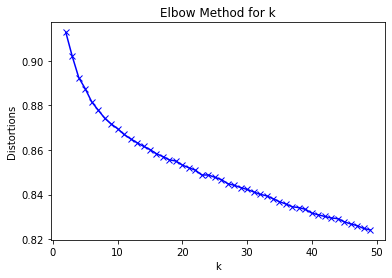

In [18]:
plt.figure()
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Elbow Method for k')
plt.show()

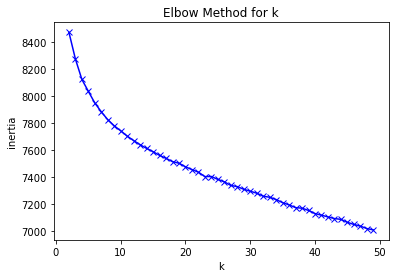

In [19]:
plt.figure()
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('inertia')
plt.title('Elbow Method for k')
plt.show()

__Clustering with KMeans__

In [44]:
kmeans = KMeans(n_clusters=3, random_state=42)
y_pred = kmeans.fit_predict(X_new)

In [45]:
y_pred

array([2, 2, 2, ..., 2, 1, 0], dtype=int32)

In [46]:
y_pred.shape

(10126,)

# Cluster Visualization

/Users/uni/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


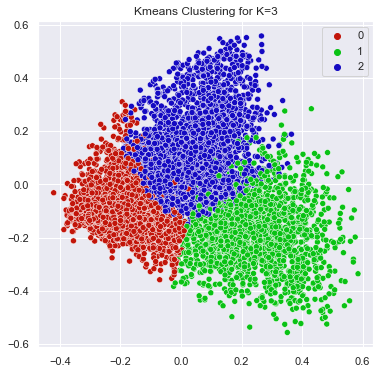

In [47]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(6,6)})

# colors
#lightness, saturaion
palette = sns.hls_palette(3, l=.4, s=.9)

# plot
# hue : Grouping variable that will produce points with different colors
#palette : Method for choosing the colors to use when mapping the hue semantic

sns.scatterplot(X_new[:,0], X_new[:,1], hue=y_pred, legend='full', palette=palette)
plt.title('Kmeans Clustering for K=3')
plt.savefig('covid.png')
plt.show()

__Write the cluster values to csv file__

In [48]:
work_data['label'] = y_pred

In [49]:
work_data.to_csv('work_data.csv',index=False)

# Cluster Visualization

In [50]:
work_metadata = pd.read_csv('work_metadata.csv')

In [51]:
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap
from bokeh.io import output_file, show
from bokeh.transform import transform
from bokeh.io import output_notebook
from bokeh.plotting import figure
from bokeh.layouts import column
from bokeh.models import RadioButtonGroup
from bokeh.models import TextInput
from bokeh.layouts import gridplot
from bokeh.models import Div
from bokeh.models import Paragraph
from bokeh.layouts import column, widgetbox

output_notebook()


# data sources
source = ColumnDataSource(data=dict(
    x= X_new[:,0],  
    y= X_new[:,1],
    desc= y_pred, 
    cluster = work_data['label'],
    index = work_metadata.index,
    titles= work_metadata['title'],
    authors = work_metadata['authors'],
    journal = work_metadata['journal'],
    abstract = work_metadata['abstract']
    ))

# hover over information
hover = HoverTool(tooltips=[
    ("Cluster", "@cluster"),
    ("Index", "@index"),
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}")
],
                 point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[7],
                     low=min(y_pred) ,high=max(y_pred))

# prepare the figure
p = figure(plot_width=900, plot_height=700, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset'], 
           title="Covid19 cluster Visualization", 
           toolbar_location="right")
p.min_border_top = 200
p.min_border_left = 500
# plot
p.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')
output_file('cluster.html')
output_notebook()

show(p)

Loading BokehJS ...

Loading BokehJS ...

# Classification

The datasets for covid19 was unlabeded data. After clustering data are labeled with cluster values. Classification is done on the basis of data labeled by clustering. If the clustering found the right cluster for each data, then the trained classifier must be able to predict the cluster for each data.

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.linear_model import SGDClassifier
from sklearn import svm
import matplotlib.pyplot as plt
from joblib import dump, load
import pandas as pd

In [54]:
X = X
y = y_pred

In [55]:
X.shape

(10126, 5000)

In [56]:
y.shape

(10126,)

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [58]:
def scores(accuracy,precision,recall,f1):
    print("Accuracy    :",accuracy)
    print("Precision.  :",precision)
    print("Recall      :",recall)
    print("F1-score.   :",f1)

In [59]:
score_names = ['accuracy', 'precision', 'recall', 'f1']
def plot(score_names, values):
    plt.figure()
    plt.bar(score_names, values)
    plt.show()

# Support Vector Machine Classifier (Used for paper)

In [60]:
svm_clf = svm.SVC(kernel='linear')
svm_clf.fit(X_train, y_train)
svm_y_predict = svm_clf.predict(X_test)

In [61]:
svm_accuracy = accuracy_score(y_test,svm_y_predict)
svm_precision = precision_score(y_test, svm_y_predict, average='macro')
svm_recall = recall_score(y_test, svm_y_predict, average='macro')
svm_f1 = f1_score(y_test, svm_y_predict, average='macro')
svm_values = [svm_accuracy, svm_precision, svm_recall, svm_f1]

In [62]:
scores(svm_accuracy, svm_precision, svm_recall, svm_f1)

Accuracy    : 0.9763001974983542
Precision.  : 0.977012293636419
Recall      : 0.9716796783163012
F1-score.   : 0.9742639137269121


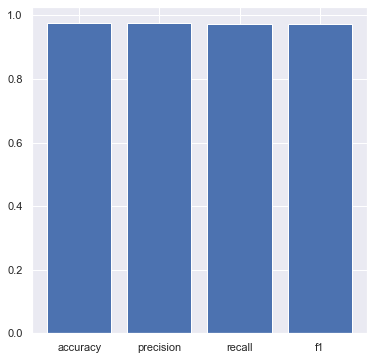

In [63]:
plot(score_names, svm_values)

__save the classification model__

In [64]:
dump(svm_clf, 'svm_clf_classification_model.joblib')

['svm_clf_classification_model.joblib']

__Stochastic Gradient Descent Classifier (Implemented just for exploration)__

In [65]:
sgd_clf = SGDClassifier(max_iter=100)
sgd_clf.fit(X_train, y_train)
sgd_pred = cross_val_predict(sgd_clf, X_train, y_train, cv=3)

In [66]:
sgd_accuracy = accuracy_score(y_train, sgd_pred)
sgd_precision = precision_score(y_train, sgd_pred,  average='macro')
sgd_recall = recall_score(y_train, sgd_pred, average='macro')
sgd_f1 = f1_score(y_train, sgd_pred, average='macro')
sgd_values = [sgd_accuracy, sgd_precision, sgd_recall, sgd_f1]

In [67]:
scores(sgd_accuracy, sgd_precision, sgd_recall, sgd_f1)

Accuracy    : 0.9693848758465011
Precision.  : 0.9660739920633152
Recall      : 0.9670810114317518
F1-score.   : 0.9665136809238867


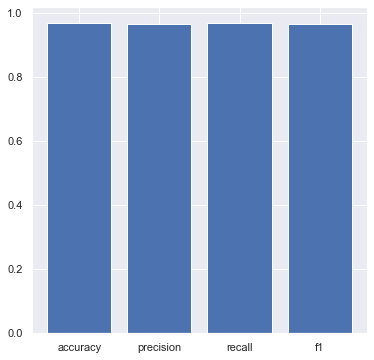

In [68]:
plot(score_names, sgd_values)

In [69]:
dump(sgd_clf, 'sgd_clf_classification_model.joblib')

['sgd_clf_classification_model.joblib']